In [ ]:
!unzip "drive/MyDrive/dog-breed-identification.zip"

# End to End Multi-class 🐶 Dog Breed Classification
In this jupyter notebook we are gonna build an end-to-end dog breed classifier using Tensorflow 2.x and Tensorflow Hub.

## 1. Problem
To identify the breed of the dog from the image.

## 2. Data
We're using an dataset from Kaggle dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data:

* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

# Getting our workspace ready

In [ ]:
# import all the necessory tools
import tensorflow as tf
import tensorflow_hub as hub

# Check version
print('Tf verison',tf.__version__)
print('Tf Hub version',hub.__version__)

# Check for GPU
print("GPU is", "available :)" if tf.config.list_physical_devices("GPU") else "not available :(")

Tf verison 2.12.0
Tf Hub version 0.13.0
GPU is available :)


## Geting our data ready (turning into tensors)
For all ML model we need to convert our data into numeric form. That's what we are gonna do converting images into tensors (numeric value). 

In [ ]:
import pandas as pd
labels_csv = pd.read_csv('/content/labels.csv')
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

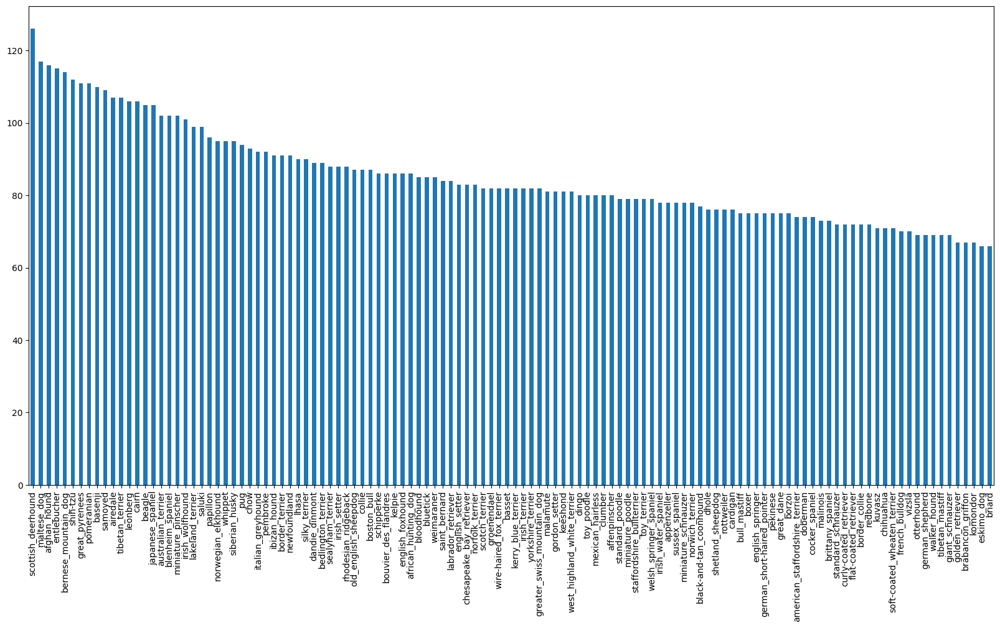

In [ ]:
# # How many images are there for each breed
# labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
# # Median per image
# labels_csv['breed'].value_counts().median()

82.0

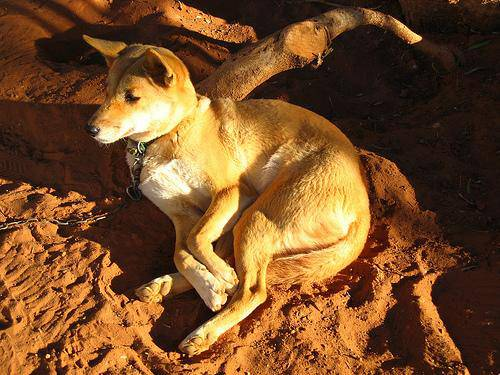

In [ ]:
# # Display an image
# from IPython.display import Image
# Image('/content/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

## Getting images and their labels

In [ ]:
# Creating pathname for image ID's
filenames = ['/content/train/' + fname + '.jpg' for fname in labels_csv['id']]

# Show 10 filenames
filenames[:10]

['/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether no. of filenames matches the no. of actual images
import os
if len(os.listdir('/content/train')) == len(filenames):
  print("Filenames matches no. of actual images!!!")
else:
    print("Filenames does not matches no. of actual images :(")

Filenames matches no. of actual images!!!


In [ ]:
# # One more check
# labels_csv['breed'][10000]

'pembroke'

Now let's prepare our labels

In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
# Find unique labels
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn lables into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## Creating our validation set

In [ ]:
# Setup X and y variable
X = filenames
y = boolean_labels

we are going to start with ~1000 images

In [ ]:
# Set number of images to be used for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:1000 }

In [ ]:
# Lets split our data into train and validation
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

# Preprocessing Images (turning images into Tensors)
To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an `image` filepath as input.
2. Use TensorFlow to read the file and save it to a variable, `image`.
3. Turn our `image` (a jpg) into Tensors.
4. Normalize our `image` (convert color channel values from from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224).
6. Return the modified `image`.


In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

We'll create a function to:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`.
3. Turn our `image` (a jpg) into Tensors.
4. Normalize our `image` (convert color channel values from from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224).
6. Return the modified `image`.

In [ ]:
# Define image size
IMG_SIZE = 224

# create a function to preprocess the data
def process_image(image_path, img_size= IMG_SIZE):
  """
    Take an image and turn it into tensor.
  """
  # Read an image file
  image = tf.io.read_file(image_path)
  # Turn the image into a numerical tensor with 3 colour channles (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired values (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

In [ ]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Creating our training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# # Check out the different attributes of our data batches
# train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

In [ ]:
# import matplotlib.pyplot as plt

# # Create a function for viewing images in a data batch
# def show_25_images(images, labels):
#   """
#   Displays a plot of 25 images and their labels from a data batch.
#   """
#   # Setup the figure
#   plt.figure(figsize=(10, 10))
#   # Loop through 25 (for displaying 25 images)
#   for i in range(25):
#     # Create subplots (5 rows, 5 columns)
#     ax = plt.subplot(5, 5, i+1)
#     # Display an image 
#     plt.imshow(images[i])
#     # Add the image label as the title
#     plt.title(unique_breeds[labels[i].argmax()])
#     # Turn the grid lines off
#     plt.axis("off")

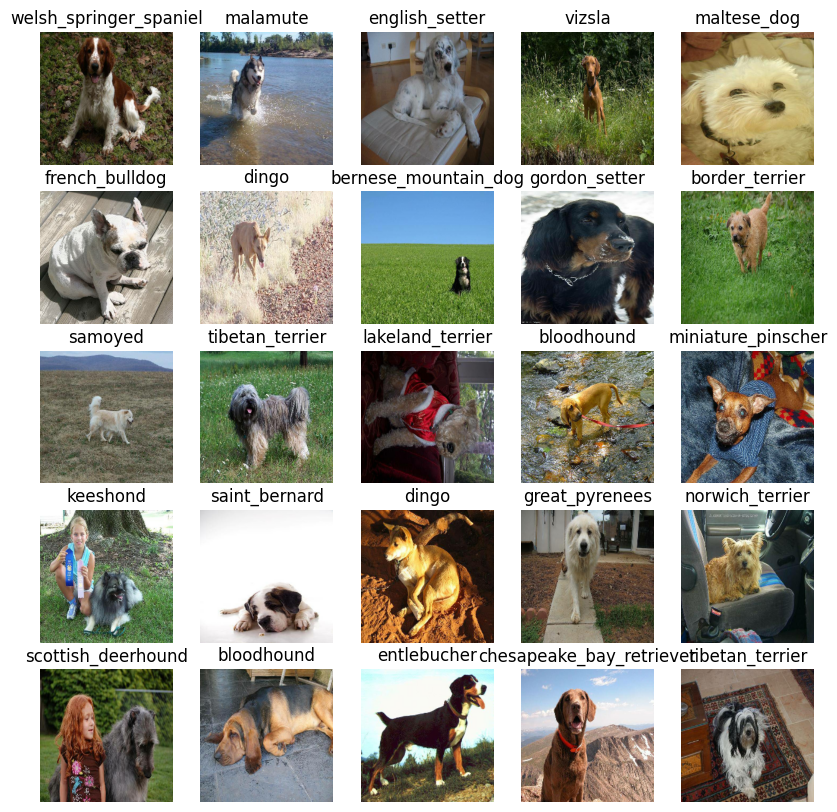

In [ ]:
# # Now let's visualize the data in a training batch
# train_images, train_labels = next(train_data.as_numpy_iterator())
# show_25_images(train_images, train_labels)

# Building our Model

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 16s 133ms/step - loss: 4.5829 - accuracy: 0.1075 - val_loss: 3.4616 - val_accuracy: 0.2100
Epoch 2/100
25/25 [==============================] - 2s 95ms/step - loss: 1.6811 - accuracy: 0.6625 - val_loss: 2.2315 - val_accuracy: 0.4500
Epoch 3/100
25/25 [==============================] - 3s 137ms/step - loss: 0.5885 - accuracy: 0.9312 - val_loss: 1.6976 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 2s 78ms/step - loss: 0.2638 - accuracy: 0.9875 - val_loss: 1.5101 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 2s 84ms/step - loss: 0.1524 - accuracy: 0.9962 - val_loss: 1.4225 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 2s 86ms/step - loss: 0.1038 - accuracy: 0.9975 - val_loss: 1.3845 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] -

In [ ]:
%tensorboard --logdir drive/MyDrive//logs

<IPython.core.display.Javascript object>

## Making and evaluating prediction using trained model 

In [ ]:
# Make prediction on the validation set
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 9s 67ms/step


array([[5.39663108e-03, 4.54907771e-04, 1.44935679e-04, ...,
        3.27562448e-04, 5.55380429e-05, 1.32211410e-02],
       [7.00651144e-04, 1.08350674e-03, 2.37022017e-04, ...,
        1.28375497e-04, 7.00449047e-04, 1.92603748e-05],
       [3.35915797e-06, 1.19594704e-04, 8.02409158e-06, ...,
        9.03042674e-05, 8.31829966e-05, 3.94073373e-04],
       ...,
       [1.29683531e-05, 9.81687263e-05, 2.09853839e-04, ...,
        1.69721636e-04, 5.47950389e-04, 6.54874893e-04],
       [1.40436543e-02, 1.12844304e-04, 1.00708094e-04, ...,
        2.68844975e-04, 1.42266392e-04, 4.67932504e-03],
       [2.81840883e-04, 1.62712866e-04, 4.08332236e-03, ...,
        1.20649617e-02, 9.97425523e-04, 2.93251098e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
# First prediction
index= 30
print(predictions[index])
print("Max Value (Probability of prediction):", np.max(predictions[index]))
print("Sum:", np.sum(predictions[index]))
print("Max Index:", np.argmax(predictions[index]))
print("Predicted labels:", unique_breeds[np.argmax(predictions[index])])

[1.16995117e-03 1.08300505e-04 1.45224520e-04 6.36109966e-04
 1.02886064e-02 6.26666151e-05 9.42201260e-03 1.10066857e-03
 2.39474946e-04 2.51882477e-04 2.20760307e-03 8.01807211e-04
 5.55210245e-05 1.22738566e-04 5.45075745e-04 3.35806631e-04
 3.61490020e-05 5.59069822e-03 1.30566332e-04 4.55845206e-04
 4.65953955e-04 1.58261246e-04 1.59813731e-04 1.28610889e-04
 4.62776952e-04 1.09344219e-04 5.48106385e-04 9.75056391e-05
 7.54342400e-05 1.04162900e-03 2.07407953e-04 9.39019490e-03
 1.49681495e-04 1.33297275e-04 1.30302622e-04 5.26823878e-01
 1.35414184e-05 2.29770143e-04 3.34393444e-05 2.16220113e-04
 3.86820245e-03 4.34511749e-05 3.80354031e-04 5.49609686e-05
 8.73190147e-05 1.33580703e-03 4.82754695e-05 5.20357746e-04
 4.80341638e-04 5.78055588e-05 1.07345905e-03 4.98262852e-05
 1.12586255e-04 3.65604152e-04 2.95510661e-04 1.93807922e-04
 3.46920569e-05 6.87893247e-04 7.49740793e-05 1.23208272e-03
 1.32176356e-04 2.61069690e-05 8.19638371e-04 3.06886534e-04
 2.81982822e-04 2.698067

In [ ]:
# create a function to convert prediction probability into respective label
def get_pred_label(prediction_probability):
  return unique_breeds[np.argmax(prediction_probability)]

In [ ]:
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

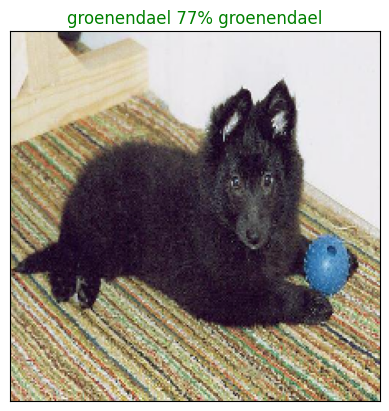

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

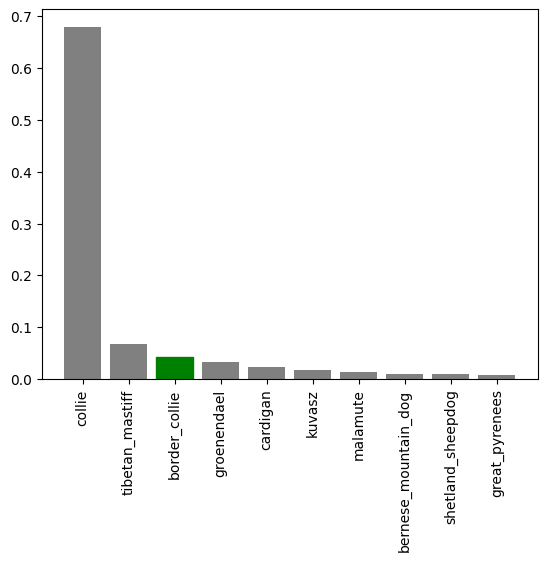

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

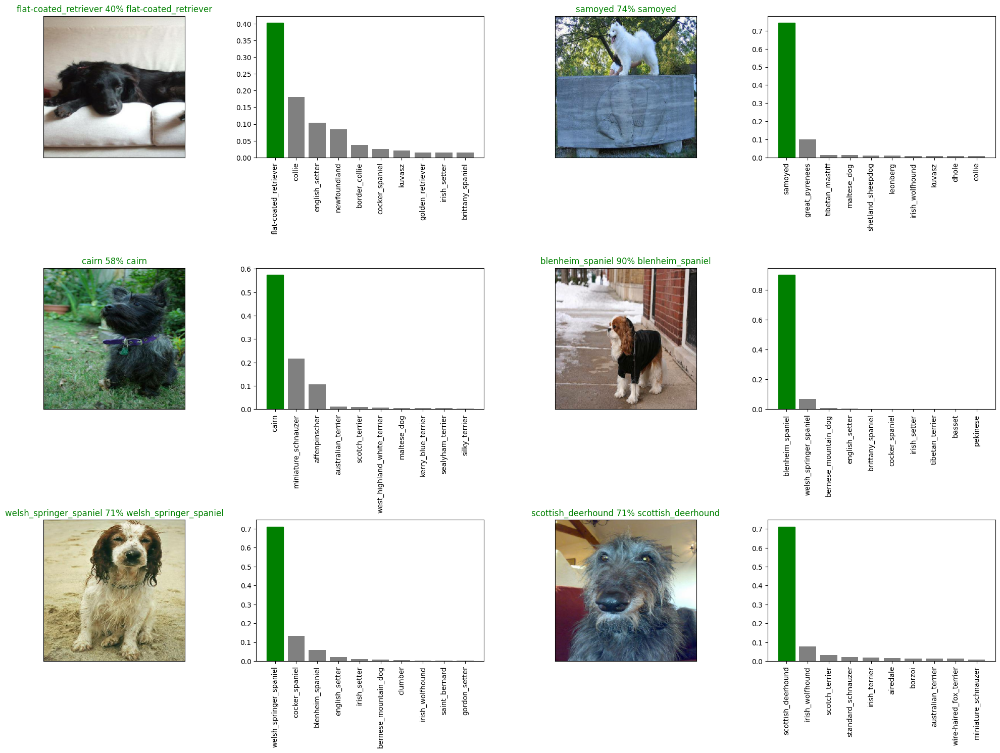

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model


In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/models/20230527-09331685180032-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/models/20230527-09331685180032-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/models/20230527-09331685180032-1000-images-mobilenetv2-Adam.h5')


Loading saved model from: drive/MyDrive/models/20230527-09331685180032-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 153ms/step - loss: 1.3223 - accuracy: 0.6550


[1.3223068714141846, 0.6549999713897705]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 63ms/step - loss: 1.3223 - accuracy: 0.6550


[1.3223068714141846, 0.6549999713897705]

# Training a big dog model

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 31s 68ms/step - loss: 1.3322 - accuracy: 0.6738
Epoch 2/100
320/320 [==============================] - 21s 66ms/step - loss: 0.4012 - accuracy: 0.8822
Epoch 3/100
320/320 [==============================] - 22s 67ms/step - loss: 0.2366 - accuracy: 0.9372
Epoch 4/100
320/320 [==============================] - 26s 81ms/step - loss: 0.1511 - accuracy: 0.9637
Epoch 5/100
320/320 [==============================] - 24s 74ms/step - loss: 0.1085 - accuracy: 0.9769
Epoch 6/100
320/320 [==============================] - 24s 75ms/step - loss: 0.0766 - accuracy: 0.9865
Epoch 7/100
320/320 [==============================] - 22s 68ms/step - loss: 0.0593 - accuracy: 0.9915
Epoch 8/100
320/320 [==============================] - 22s 67ms/step - loss: 0.0452 - accuracy: 0.9949
Epoch 9/100
320/320 [==============================] - 23s 73ms/step - loss: 0.0381 - accuracy: 0.9954
Epoch 10/100
320/320 [==============================] - 21s 67ms/step - l

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/models/20230527-09501685181051-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/models/20230527-09501685181051-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/models/20230527-09501685181051-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/models/20230527-09501685181051-full-image-set-mobilenetv2-Adam.h5


## Making Prediction on the test data

In [ ]:
# Load test image filenames
test_path = "/content/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/test/6d15db81bb9273609d6bfcfe8f33789e.jpg',
 '/content/test/dcddc9135d0a138bb83a55bbc06adacc.jpg',
 '/content/test/d7cf793caa78dfc64e3b01c2d20d4c7d.jpg',
 '/content/test/81903675522a5dd779a392299427cbc1.jpg',
 '/content/test/e78b4a09e5f86c330e24c6aaed63f0be.jpg',
 '/content/test/5333ccb08620f8f0855750adc4138c27.jpg',
 '/content/test/a10202b48ff2ee934e458c54a58ecfe2.jpg',
 '/content/test/f710b7b398babf2e0602e8ee38f1746f.jpg',
 '/content/test/58f0fca409901bfc8d22851eff1feac5.jpg',
 '/content/test/4a692ed4c770d44d6ad825b7f43b31ca.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/dog-vision-prediction-probabilites-array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.61196489e-09, 3.44086413e-12, 2.32834394e-11, ...,
        1.06917716e-13, 1.58530451e-08, 1.52161670e-06],
       [3.17894322e-10, 3.20088262e-14, 1.85374840e-10, ...,
        7.00588814e-08, 1.88822238e-08, 2.56980937e-10],
       [4.27301083e-09, 1.84139528e-13, 1.11784948e-09, ...,
        2.71949238e-12, 2.23927123e-06, 7.41860809e-11],
       ...,
       [4.47232779e-10, 4.28004029e-07, 4.11986996e-08, ...,
        4.65437893e-07, 8.21722967e-10, 8.86002116e-09],
       [3.50528079e-11, 1.94377336e-03, 1.44941642e-10, ...,
        1.56135718e-06, 6.13228721e-08, 7.32120961e-12],
       [1.23221771e-08, 3.08354520e-09, 1.87174110e-10, ...,
        8.16165635e-10, 9.98905063e-01, 6.73740752e-09]])

In [ ]:
test_predictions.shape

(10357, 120)

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,6d15db81bb9273609d6bfcfe8f33789e,1.611965e-09,3.440864e-12,2.328344e-11,1.407994e-12,5.980330e-09,2.145339e-11,5.328517e-10,1.764934e-10,4.491057e-11,...,8.200658e-09,4.056766e-08,2.202154e-11,3.074556e-12,7.080598e-12,3.024534e-09,2.991727e-07,1.069177e-13,1.585305e-08,1.521617e-06
1,dcddc9135d0a138bb83a55bbc06adacc,3.178943e-10,3.200883e-14,1.853748e-10,1.954662e-13,8.682216e-07,3.362278e-07,2.264711e-06,9.995926e-01,1.876677e-10,...,3.441671e-07,1.129437e-04,6.675200e-09,1.690707e-06,6.804413e-10,5.923428e-09,5.574148e-09,7.005888e-08,1.888222e-08,2.569809e-10
2,d7cf793caa78dfc64e3b01c2d20d4c7d,4.273011e-09,1.841395e-13,1.117849e-09,1.106639e-10,7.225005e-11,1.169239e-05,7.223256e-07,5.553372e-04,9.785655e-11,...,3.530463e-09,4.605002e-05,9.586189e-12,2.740325e-08,8.798643e-12,2.793681e-08,1.502214e-07,2.719492e-12,2.239271e-06,7.418608e-11
3,81903675522a5dd779a392299427cbc1,5.227723e-14,3.371553e-14,1.638175e-11,5.283554e-12,7.160043e-08,1.832600e-13,6.625124e-13,1.087913e-13,8.482403e-11,...,5.968796e-12,1.492889e-13,2.230498e-06,4.158368e-10,9.999646e-01,3.224581e-13,1.426521e-11,2.974644e-12,8.130380e-13,6.134530e-11
4,e78b4a09e5f86c330e24c6aaed63f0be,9.613753e-11,1.304277e-08,1.246931e-08,1.478856e-07,6.658420e-09,6.374474e-12,2.422878e-05,4.128350e-09,1.767556e-04,...,1.207746e-06,2.052871e-08,6.508744e-13,2.080402e-10,1.428936e-09,5.703394e-08,1.541623e-06,2.052792e-05,3.110282e-04,1.318874e-06


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)